<a href="https://colab.research.google.com/github/Joshuajee/AI-ML-PROJECTS/blob/master/deeplearning/object%20detection/Detect.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!nvidia-smi

Mon Dec  8 23:59:14 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   48C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
import os
HOME = os.getcwd()
print(HOME)

/content


In [3]:
!pip install ultralytics==8.2.103 -q

from IPython import display
display.clear_output()

# prevent ultralytics from tracking your activity
!yolo settings sync=False

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.2.103 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 38.5/112.6 GB disk)


In [4]:
from ultralytics import YOLO

from IPython.display import display, Image

In [5]:
!pip install roboflow==1.1.48 --quiet
!pip install python-dotenv --quiet

from roboflow import Roboflow
from dotenv import load_dotenv

load_dotenv()

api_key = os.environ.get('ROBOFLOW_API_KEY')

if api_key is None:
  try: # Try to get it from colab ensure you have added it to the secret
    from google.colab import userdata
    api_key = userdata.get('ROBOFLOW_API_KEY')
  except:
    raise ValueError("ROBOFLOW_API_KEY environment variable not set. Please set it in a .env file or Colab Secrets.")

rf = Roboflow(api_key=api_key)
project = rf.workspace("jee-cmmsh").project("hand-tool-detection-pbu9x")

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 80.3/80.3 kB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 13.8 MB/s eta 0:00:00
loading Roboflow workspace...
loading Roboflow project...


## Download Dataset

In [6]:
api_key #= None

'TEhsvTpU2TEQFRlBFsml'

In [7]:
!mkdir -p {HOME}/datasets
%cd {HOME}/datasets

version = project.version(5)
dataset_v8 = version.download("yolov8")
dataset_v9 = version.download("yolov9")

/content/datasets



Extracting Dataset Version Zip to Hand-Tool-Detection-5 in yolov8:: 100%|██████████| 756/756 [00:00<00:00, 9532.17it/s]


In [8]:
!mkdir -p {HOME}/datasets
%cd {HOME}/datasets

version = project.version(6)
dataset_aug_v8 = version.download("yolov8")
dataset_aug_v9 = version.download("yolov9")

/content/datasets



Extracting Dataset Version Zip to Hand-Tool-Detection-6 in yolov8:: 100%|██████████| 1940/1940 [00:00<00:00, 2172.38it/s]


## YOLOv8

In [9]:
%cd {HOME}

!yolo task=detect mode=train model=yolov8s.pt data={dataset_v8.location}/data.yaml epochs=100 imgsz=512 plots=True name="YOLOv8_no_aug"

/content
100% 21.5M/21.5M [00:00<00:00, 121MB/s]
New https://pypi.org/project/ultralytics/8.3.235 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.2.103 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/datasets/Hand-Tool-Detection-5/data.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=512, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=YOLOv8_no_aug, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, ag

/content


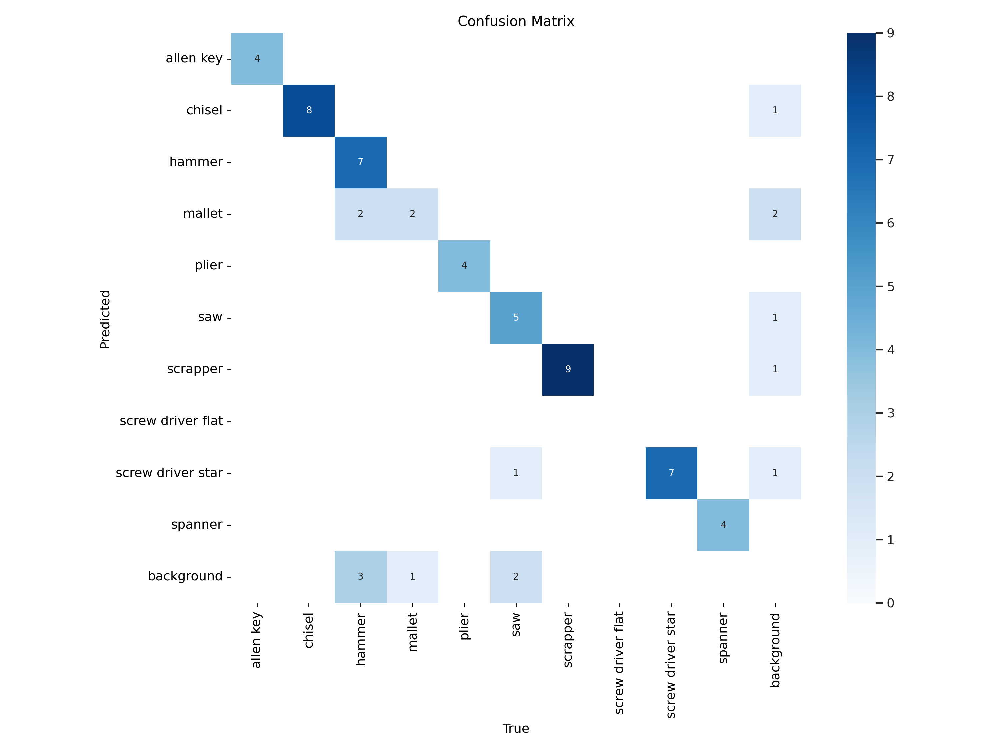

In [10]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/YOLOv8_no_aug/confusion_matrix.png', width=1000)

/content


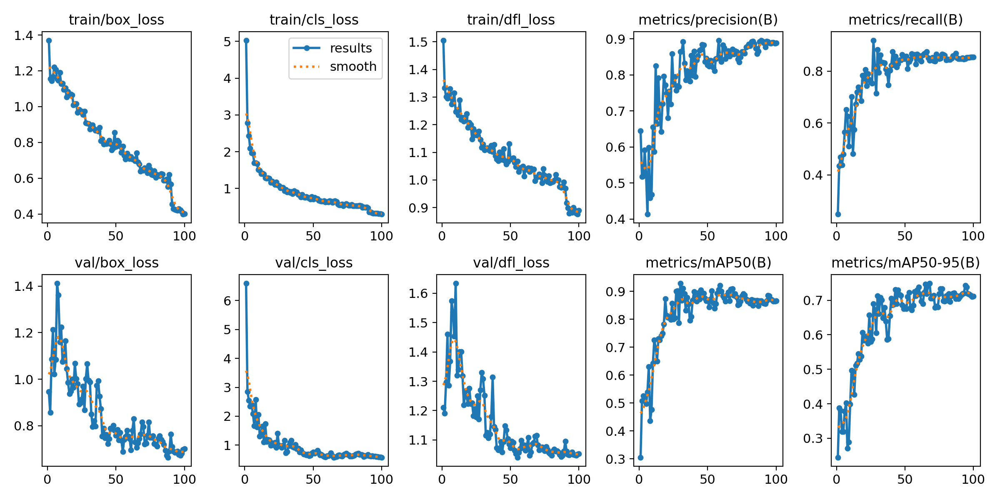

In [11]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/YOLOv8_no_aug/results.png', width=1000)

/content


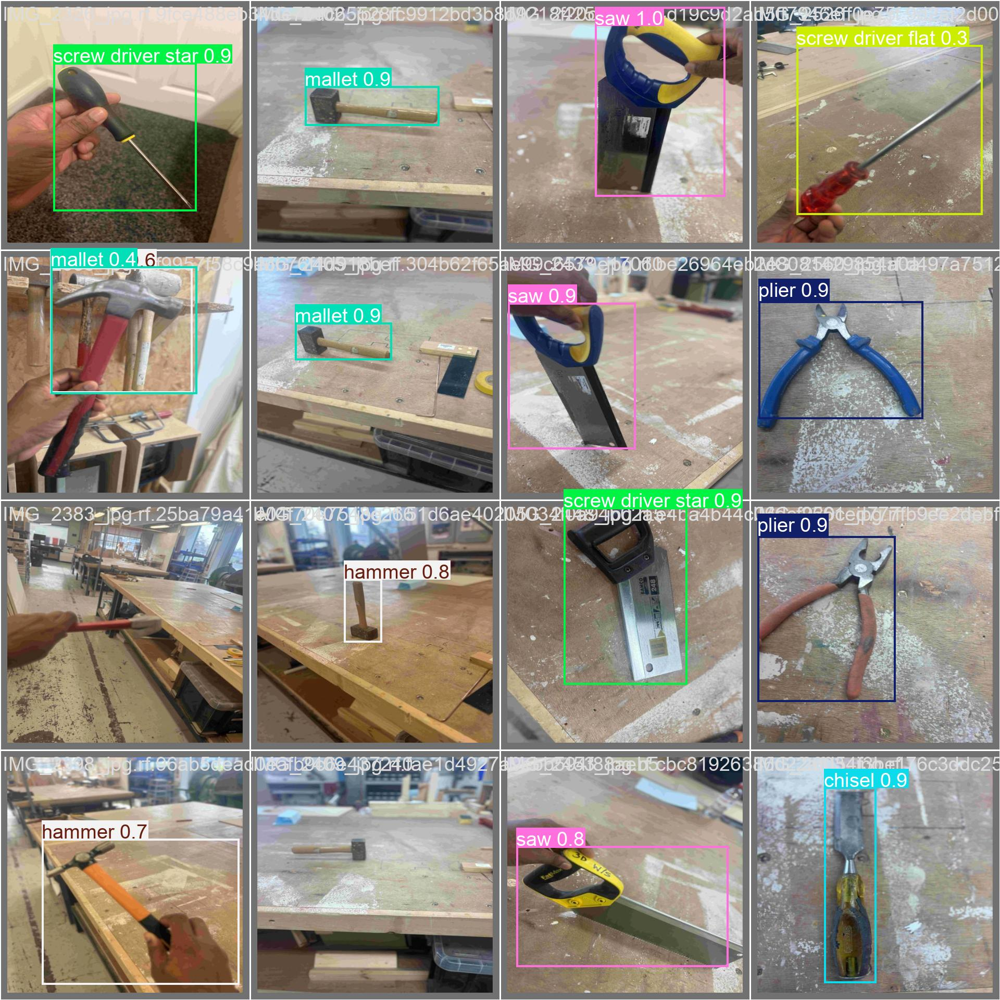

In [12]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/YOLOv8_no_aug/val_batch0_pred.jpg', width=1000)

### Validate YOLOv8

/content


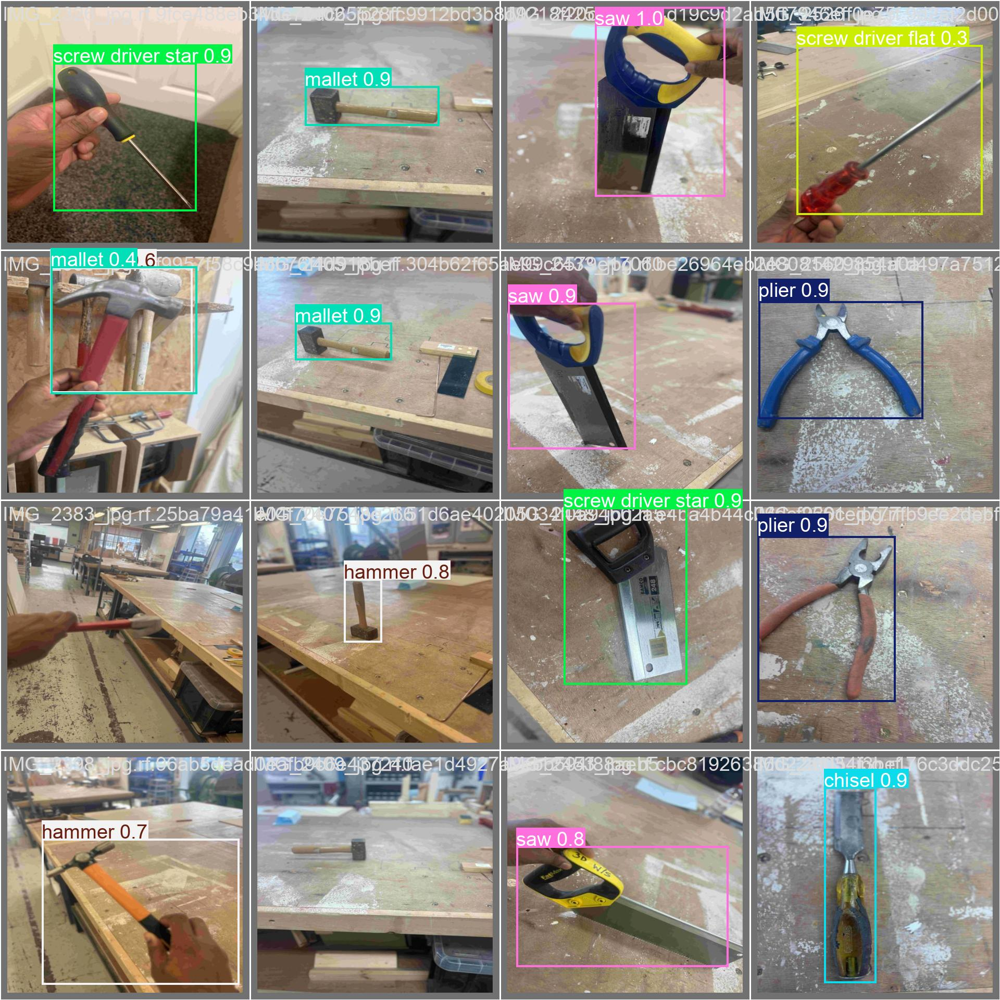

In [28]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/YOLOv8_no_aug/val_batch0_pred.jpg', width=1000)

In [13]:
%cd {HOME}
!yolo task=detect mode=val model={HOME}/runs/detect/YOLOv8_no_aug/weights/best.pt data={dataset_v8.location}/data.yaml

/content
Ultralytics YOLOv8.2.103 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 168 layers, 11,129,454 parameters, 0 gradients, 28.5 GFLOPs
val: Scanning /content/datasets/Hand-Tool-Detection-5/valid/labels.cache... 38 images, 0 backgrounds, 0 corrupt: 100% 38/38 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 3/3 [00:01<00:00,  2.34it/s]
                   all         38         59      0.872      0.842      0.907       0.75
             allen key          4          4      0.955          1      0.995      0.891
                chisel          6          8      0.977          1      0.995      0.745
                hammer         11         12          1      0.427      0.836      0.606
                mallet          3          3      0.382      0.667      0.672      0.605
                 plier          4          4      0.988          1      0.995      0.849
                   sa

### Inference with YOLOv8

In [14]:
%cd {HOME}
!yolo task=detect mode=predict model={HOME}/runs/detect/YOLOv8_no_aug/weights/best.pt conf=0.25 source={dataset_v8.location}/test/images save=True name="YOLOv8_no_aug_predictions"

/content
Ultralytics YOLOv8.2.103 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 168 layers, 11,129,454 parameters, 0 gradients, 28.5 GFLOPs

image 1/38 /content/datasets/Hand-Tool-Detection-5/test/images/IMG_2385_jpg.rf.6ef11b5af92f9946bc3ea109902311b9.jpg: 512x512 (no detections), 10.8ms
image 2/38 /content/datasets/Hand-Tool-Detection-5/test/images/IMG_2386_jpg.rf.1439edfbf4836fd4f95d12dfd5083c83.jpg: 512x512 1 plier, 10.8ms
image 3/38 /content/datasets/Hand-Tool-Detection-5/test/images/IMG_2389_jpg.rf.750a11e918c9dab3e1eb802a79961d48.jpg: 512x512 1 hammer, 10.9ms
image 4/38 /content/datasets/Hand-Tool-Detection-5/test/images/IMG_2393_jpg.rf.5ec86b912a3e7fc706465f54be3f05f8.jpg: 512x512 1 plier, 10.8ms
image 5/38 /content/datasets/Hand-Tool-Detection-5/test/images/IMG_2429_jpg.rf.12c7ffca297064877f35cba78eafe650.jpg: 512x512 2 saws, 10.8ms
image 6/38 /content/datasets/Hand-Tool-Detection-5/test/images/IMG_2440_jpg.rf.ab6916c459e15dd13d137256975

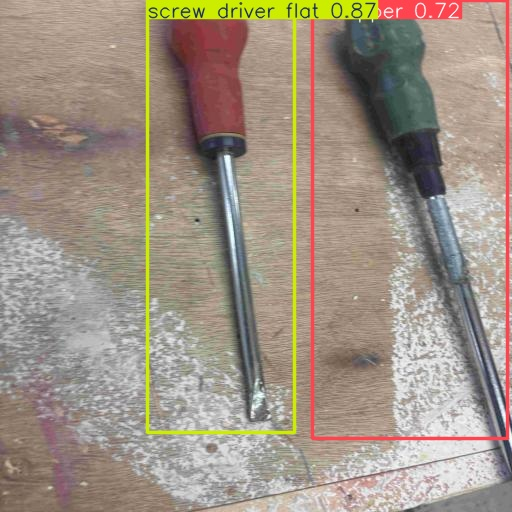

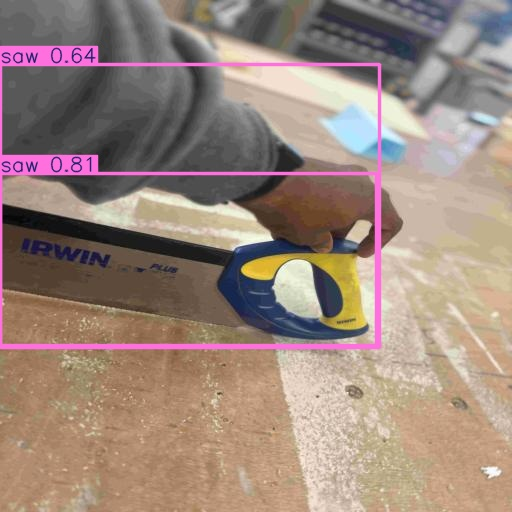

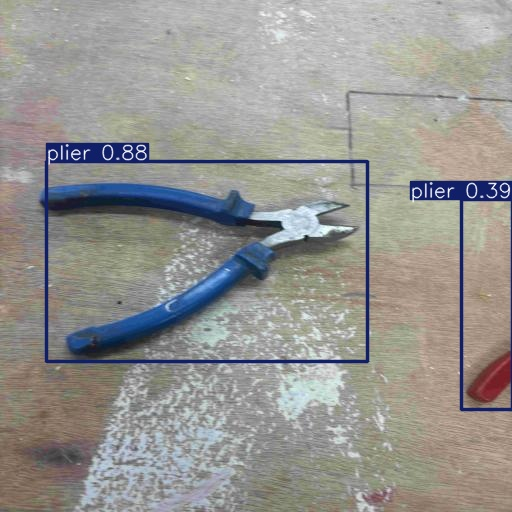

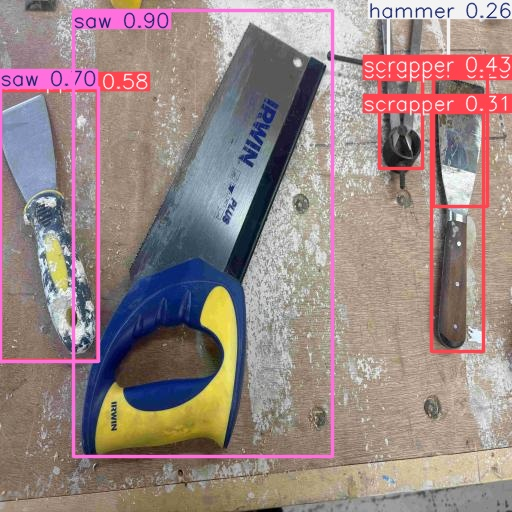

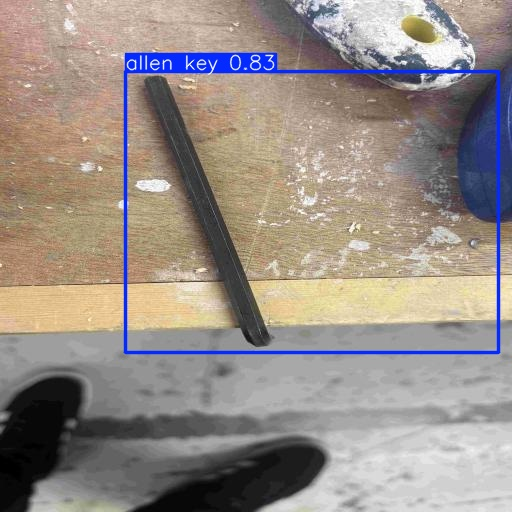

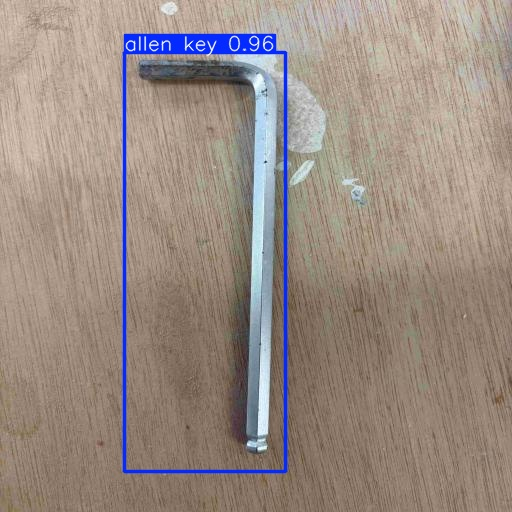

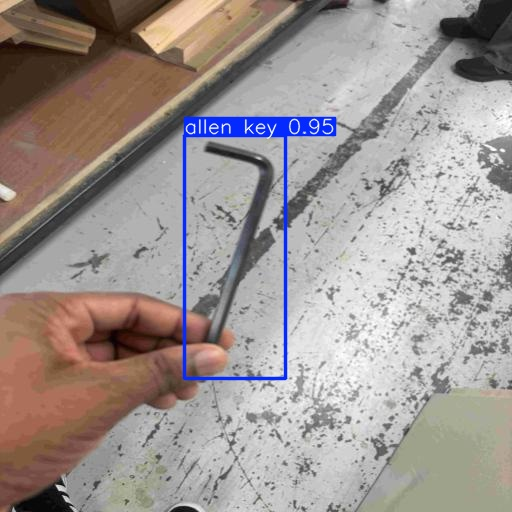

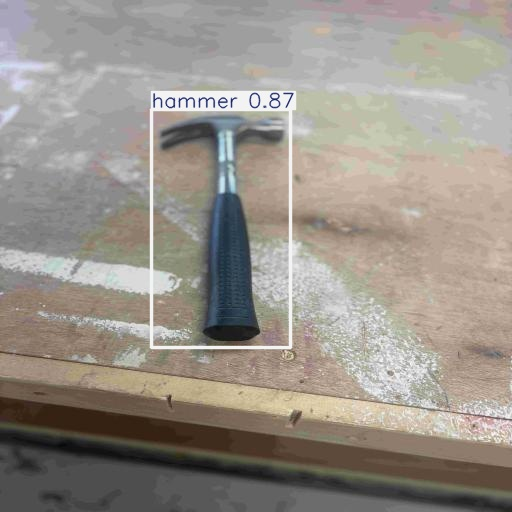

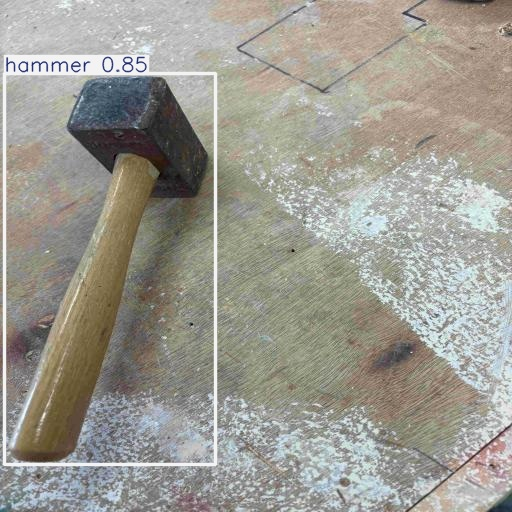

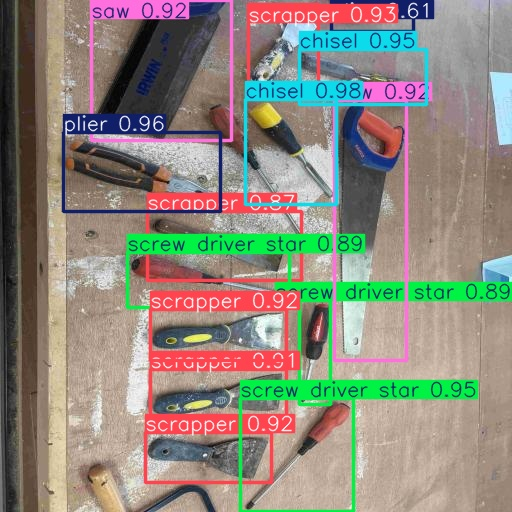

In [15]:
import glob
from IPython.display import Image, display

def print_predicted_images(folder_path, num_images=10):

    # Define the base path where the folders are located
    base_path = '/content/runs/detect/' + folder_path

    image_paths = glob.glob(f'{base_path}/*.jpg')[:num_images]

    # Display each image
    for image_path in image_paths:
        display(Image(filename=image_path, width=600))
        print("\n")

print_predicted_images("YOLOv8_no_aug_predictions")

## Training YOLOv8 with Augmented Dataset

In [16]:
%cd {HOME}
!yolo task=detect mode=train model=yolov8s.pt data={dataset_aug_v8.location}/data.yaml epochs=100 imgsz=512 plots=True name="YOLOv8_with_aug"

/content
New https://pypi.org/project/ultralytics/8.3.235 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.2.103 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/datasets/Hand-Tool-Detection-6/data.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=512, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=YOLOv8_with_aug, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina

/content


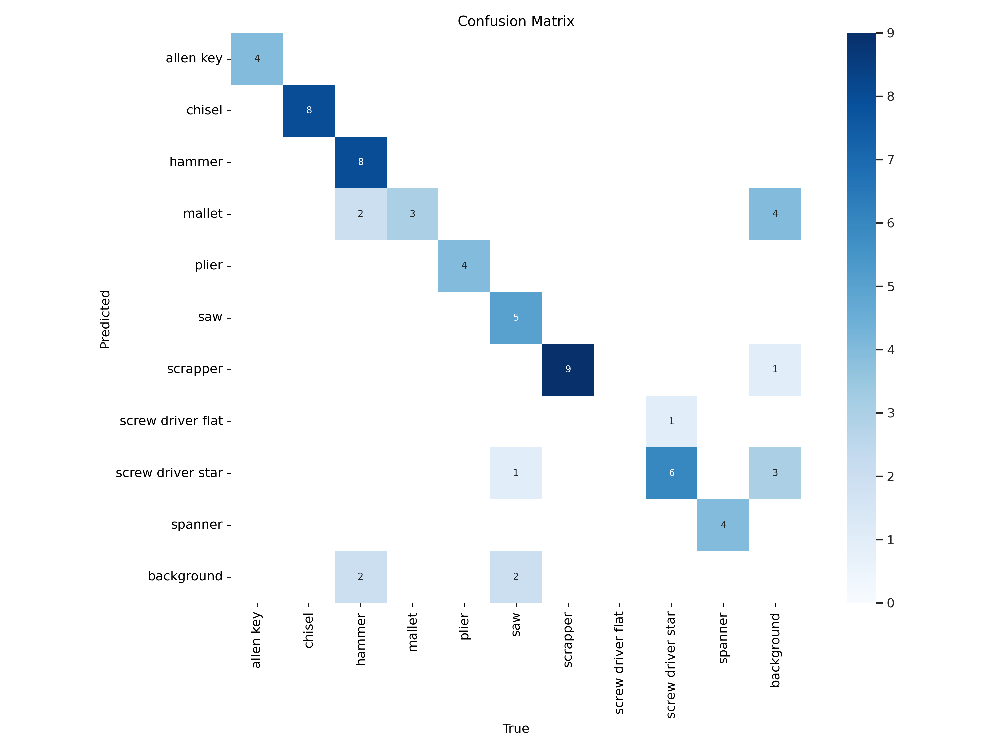

In [17]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/YOLOv8_with_aug/confusion_matrix.png', width=1000)

/content


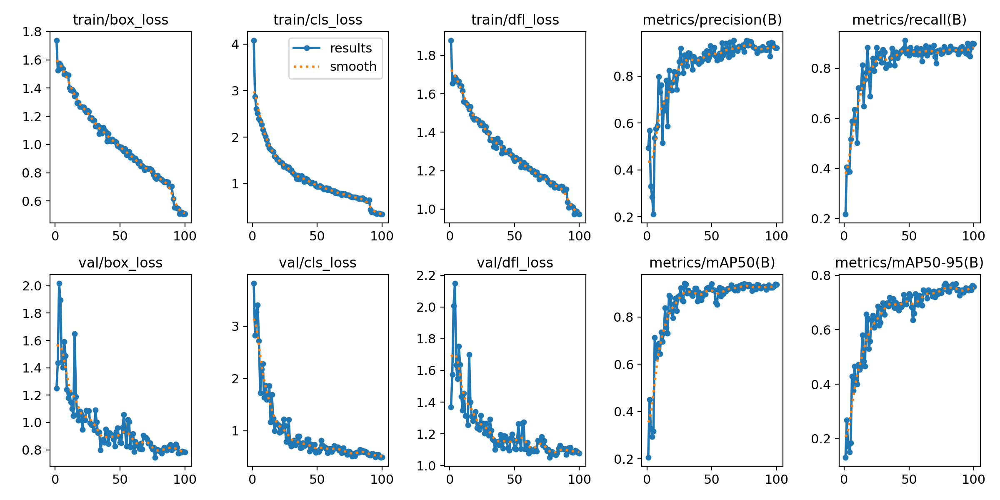

In [18]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/YOLOv8_with_aug/results.png', width=1000)

### Validate YOLOv8 with augumented data

/content


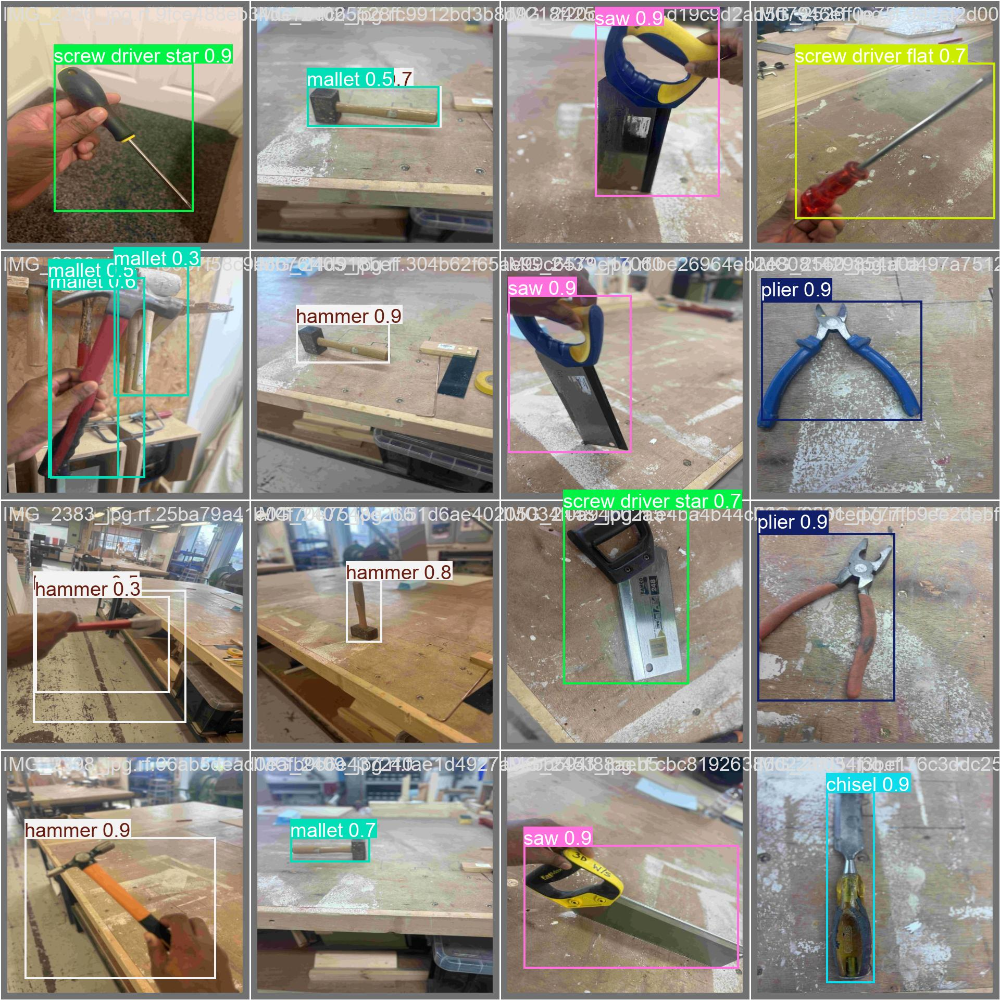

In [19]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/YOLOv8_with_aug/val_batch0_pred.jpg', width=1000)

In [20]:
%cd {HOME}
!yolo task=detect mode=val model={HOME}/runs/detect/YOLOv8_with_aug/weights/best.pt data={dataset_aug_v8.location}/data.yaml

/content
Ultralytics YOLOv8.2.103 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 168 layers, 11,129,454 parameters, 0 gradients, 28.5 GFLOPs
val: Scanning /content/datasets/Hand-Tool-Detection-6/valid/labels.cache... 38 images, 0 backgrounds, 0 corrupt: 100% 38/38 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 3/3 [00:01<00:00,  2.31it/s]
                   all         38         59       0.93      0.879       0.93      0.769
             allen key          4          4          1      0.951      0.995      0.878
                chisel          6          8      0.987          1      0.995      0.736
                hammer         11         12          1      0.667      0.801      0.618
                mallet          3          3      0.707      0.667      0.775      0.678
                 plier          4          4      0.994          1      0.995      0.866
                   sa

### Inference with YOLOv8 with augmented data

In [21]:
%cd {HOME}
!yolo task=detect mode=predict model={HOME}/runs/detect/YOLOv8_with_aug/weights/best.pt conf=0.25 source={dataset_aug_v8.location}/test/images save=True name="YOLOv8_with_aug_predictions"

/content
Ultralytics YOLOv8.2.103 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
Model summary (fused): 168 layers, 11,129,454 parameters, 0 gradients, 28.5 GFLOPs

image 1/38 /content/datasets/Hand-Tool-Detection-6/test/images/IMG_2385_jpg.rf.6ef11b5af92f9946bc3ea109902311b9.jpg: 512x512 1 hammer, 1 scrapper, 10.8ms
image 2/38 /content/datasets/Hand-Tool-Detection-6/test/images/IMG_2386_jpg.rf.1439edfbf4836fd4f95d12dfd5083c83.jpg: 512x512 1 hammer, 10.8ms
image 3/38 /content/datasets/Hand-Tool-Detection-6/test/images/IMG_2389_jpg.rf.750a11e918c9dab3e1eb802a79961d48.jpg: 512x512 1 hammer, 10.8ms
image 4/38 /content/datasets/Hand-Tool-Detection-6/test/images/IMG_2393_jpg.rf.5ec86b912a3e7fc706465f54be3f05f8.jpg: 512x512 1 hammer, 10.8ms
image 5/38 /content/datasets/Hand-Tool-Detection-6/test/images/IMG_2429_jpg.rf.12c7ffca297064877f35cba78eafe650.jpg: 512x512 1 saw, 10.8ms
image 6/38 /content/datasets/Hand-Tool-Detection-6/test/images/IMG_2440_jpg.rf.ab6916c459e15dd13d137

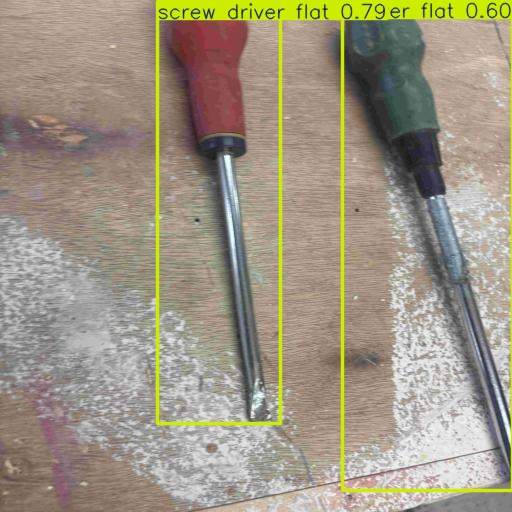

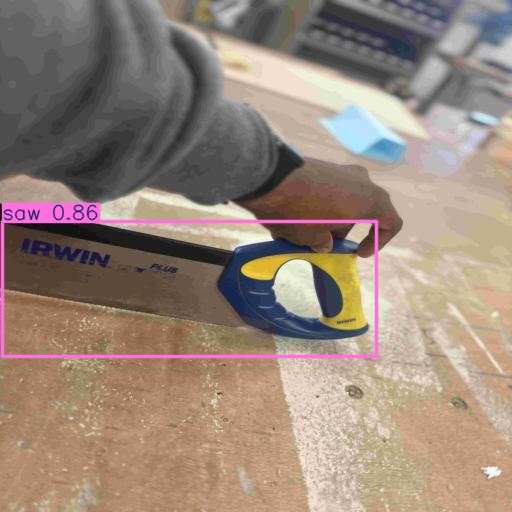

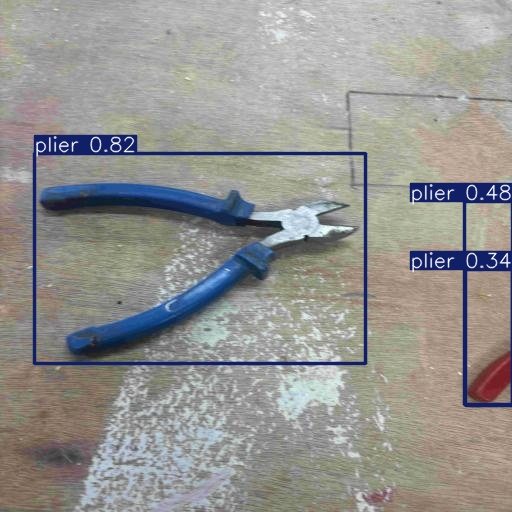

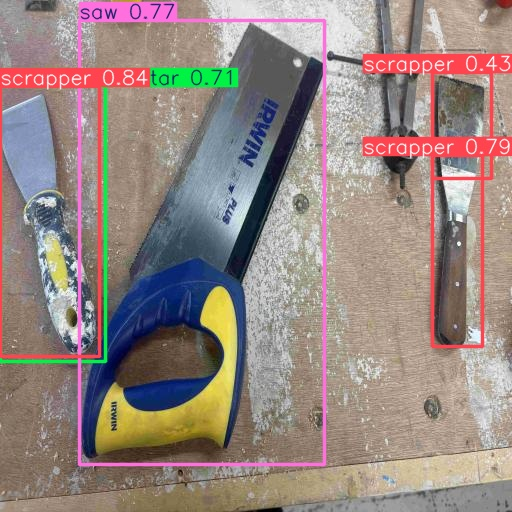

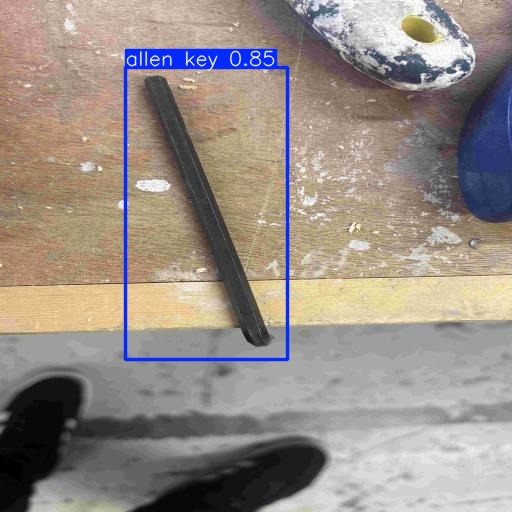

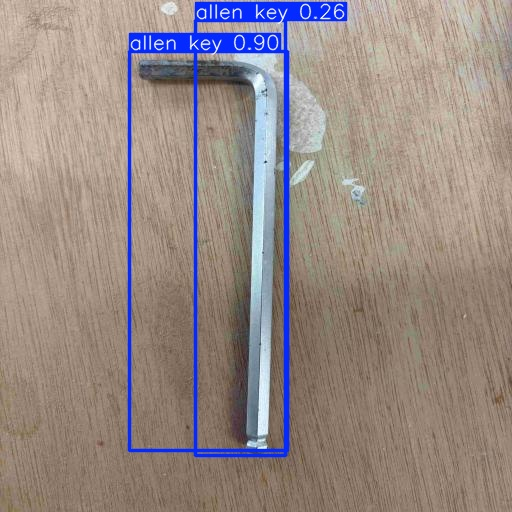

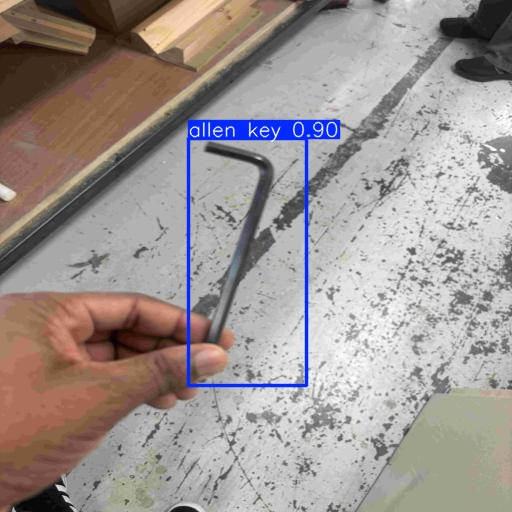

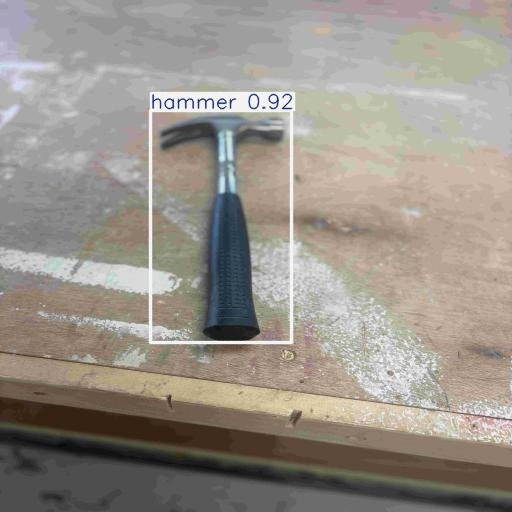

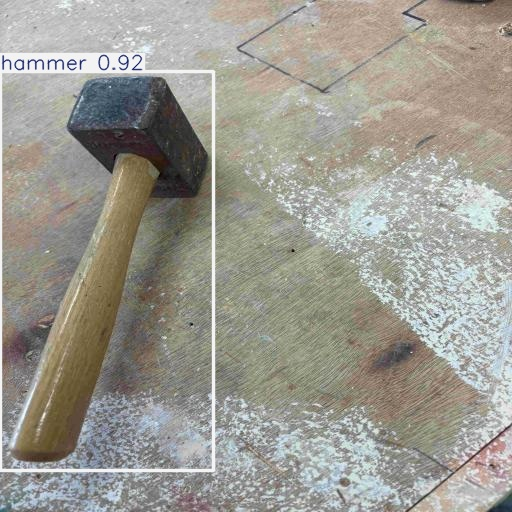

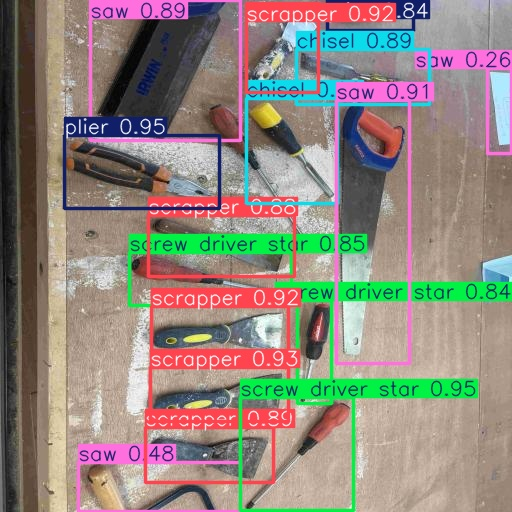

In [22]:
print_predicted_images("YOLOv8_with_aug_predictions")

## YOLOv9

In [23]:
%cd {HOME}
!yolo task=detect mode=train model=yolov9s.pt data={dataset_v9.location}/data.yaml epochs=100 imgsz=512 plots=True name="YOLOv9_no_aug"

/content
100% 14.7M/14.7M [00:00<00:00, 20.2MB/s]
New https://pypi.org/project/ultralytics/8.3.235 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.2.103 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov9s.pt, data=/content/datasets/Hand-Tool-Detection-5/data.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=512, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=YOLOv9_no_aug, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, a

/content


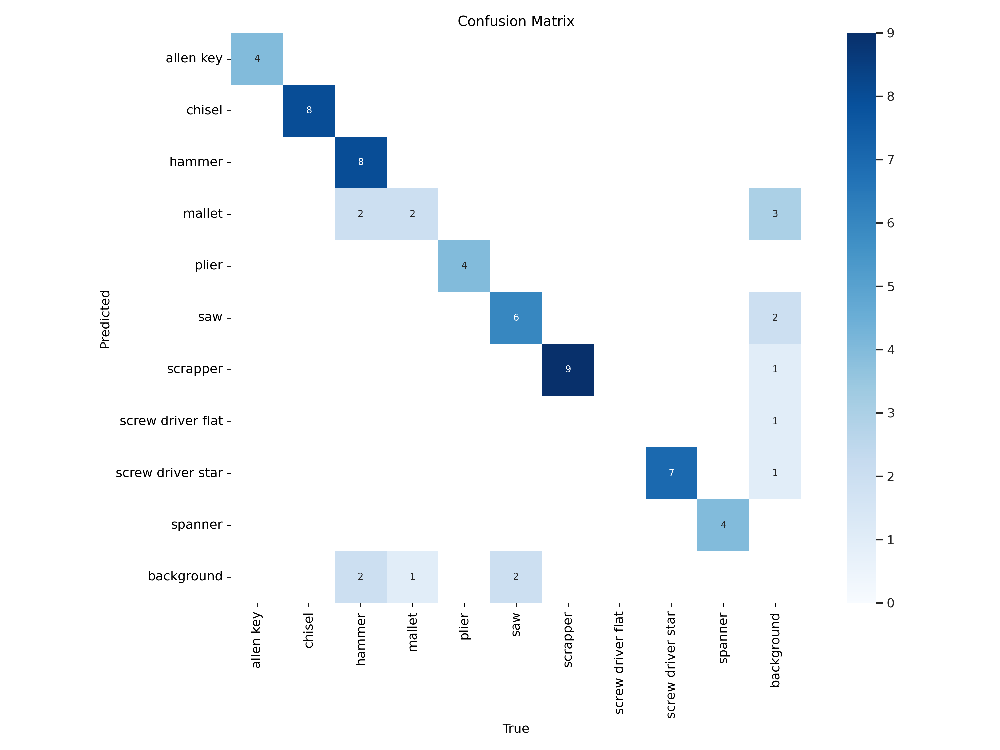

In [24]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/YOLOv9_no_aug/confusion_matrix.png', width=1000)

/content


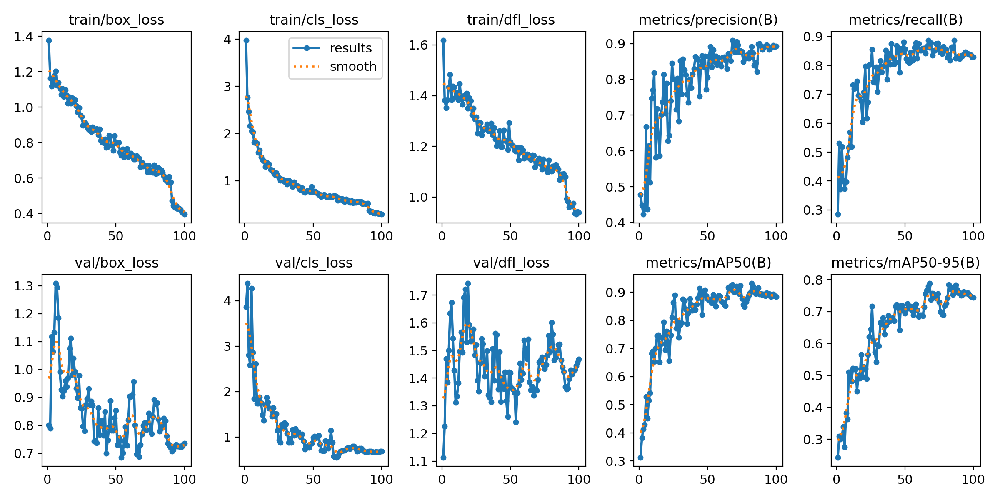

In [25]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/YOLOv9_no_aug/results.png', width=1000)

### Validate YOLOv9

/content


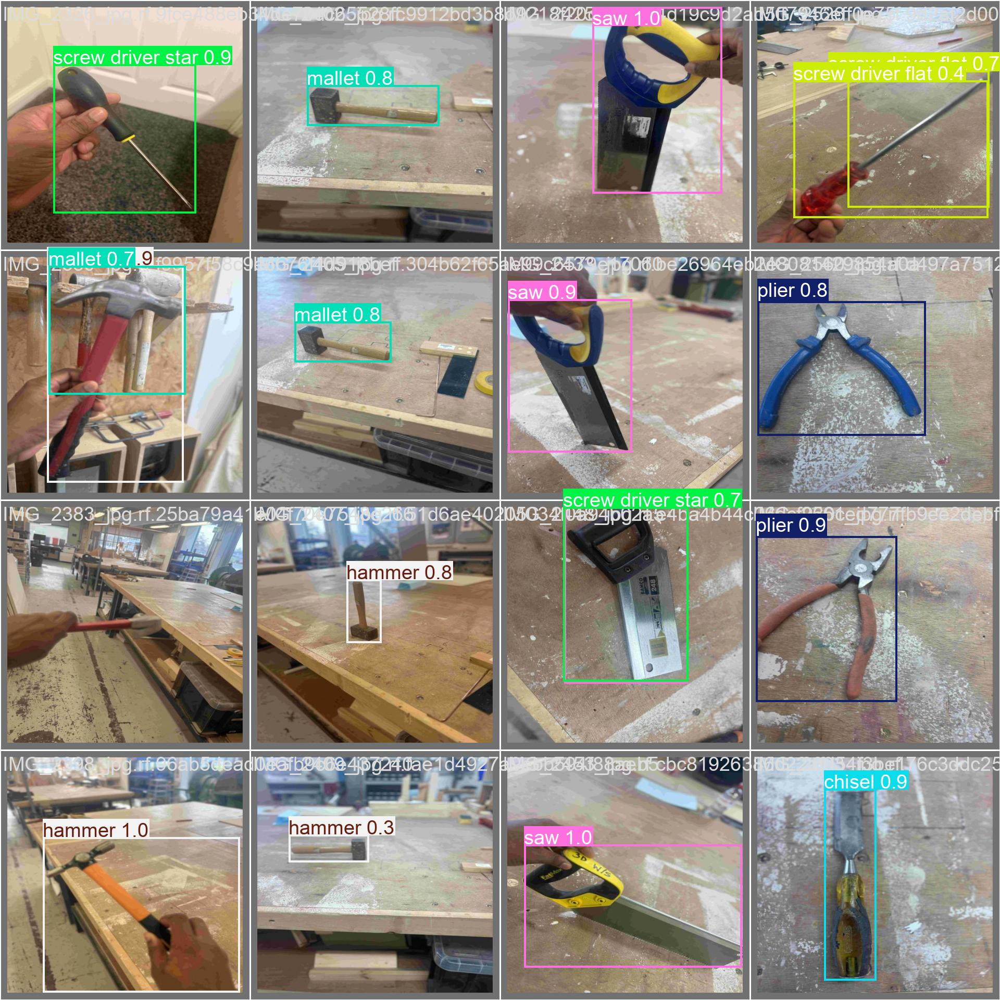

In [26]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/YOLOv9_no_aug/val_batch0_pred.jpg', width=1000)

In [27]:
%cd {HOME}
!yolo task=detect mode=val model={HOME}/runs/detect/YOLOv9_no_aug/weights/best.pt data={dataset_v9.location}/data.yaml

/content
Ultralytics YOLOv8.2.103 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLOv9s summary (fused): 486 layers, 7,170,958 parameters, 0 gradients, 26.7 GFLOPs
val: Scanning /content/datasets/Hand-Tool-Detection-5/valid/labels.cache... 38 images, 0 backgrounds, 0 corrupt: 100% 38/38 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 3/3 [00:01<00:00,  2.21it/s]
                   all         38         59      0.909      0.862      0.926      0.787
             allen key          4          4      0.986          1      0.995       0.93
                chisel          6          8      0.988          1      0.995      0.742
                hammer         11         12          1      0.594      0.888      0.711
                mallet          3          3      0.402      0.667      0.674      0.641
                 plier          4          4          1      0.822      0.995      0.921
                   s

### Inference with YOLOv9

In [29]:
%cd {HOME}
!yolo task=detect mode=predict model={HOME}/runs/detect/YOLOv9_no_aug/weights/best.pt conf=0.25 source={dataset_v9.location}/test/images save=True name="YOLOv9_no_aug_predictions"

/content
Ultralytics YOLOv8.2.103 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLOv9s summary (fused): 486 layers, 7,170,958 parameters, 0 gradients, 26.7 GFLOPs

image 1/38 /content/datasets/Hand-Tool-Detection-5/test/images/IMG_2385_jpg.rf.6ef11b5af92f9946bc3ea109902311b9.jpg: 512x512 1 hammer, 15.5ms
image 2/38 /content/datasets/Hand-Tool-Detection-5/test/images/IMG_2386_jpg.rf.1439edfbf4836fd4f95d12dfd5083c83.jpg: 512x512 1 hammer, 1 saw, 16.0ms
image 3/38 /content/datasets/Hand-Tool-Detection-5/test/images/IMG_2389_jpg.rf.750a11e918c9dab3e1eb802a79961d48.jpg: 512x512 1 hammer, 15.5ms
image 4/38 /content/datasets/Hand-Tool-Detection-5/test/images/IMG_2393_jpg.rf.5ec86b912a3e7fc706465f54be3f05f8.jpg: 512x512 1 hammer, 1 plier, 15.5ms
image 5/38 /content/datasets/Hand-Tool-Detection-5/test/images/IMG_2429_jpg.rf.12c7ffca297064877f35cba78eafe650.jpg: 512x512 1 saw, 15.5ms
image 6/38 /content/datasets/Hand-Tool-Detection-5/test/images/IMG_2440_jpg.rf.ab6916c459e15dd1

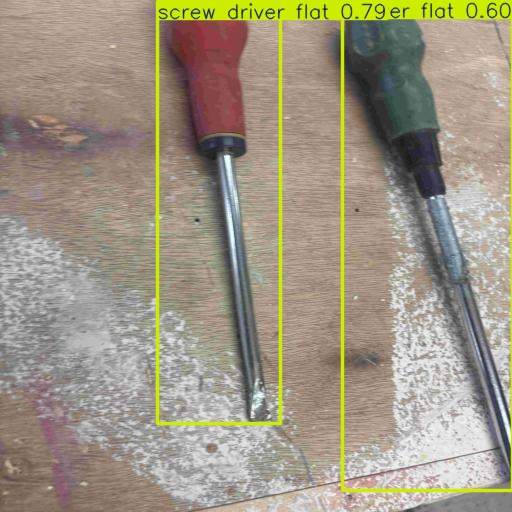

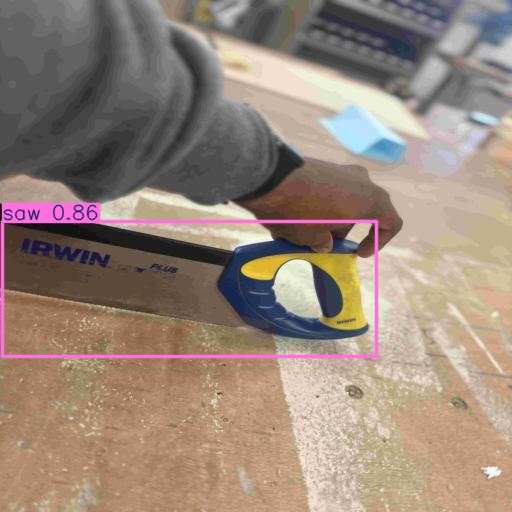

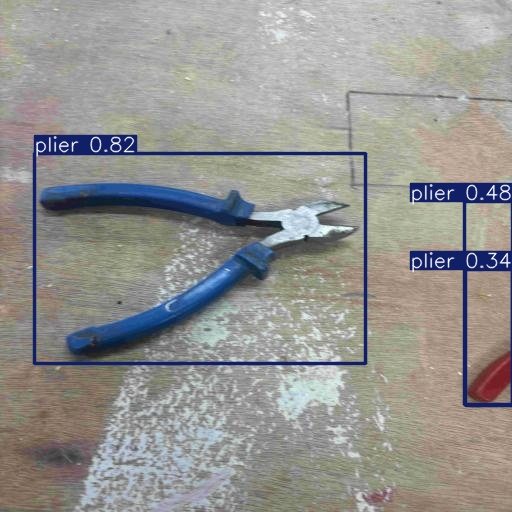

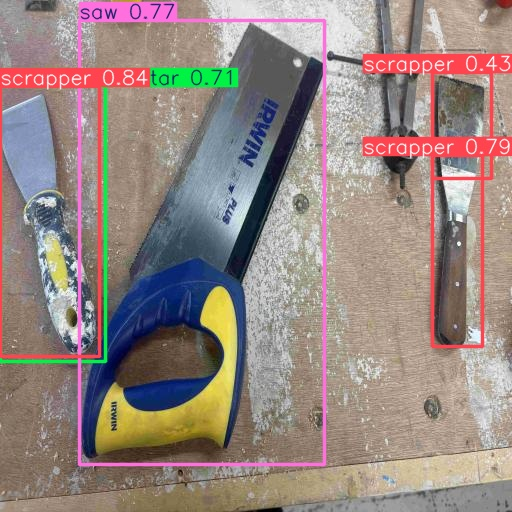

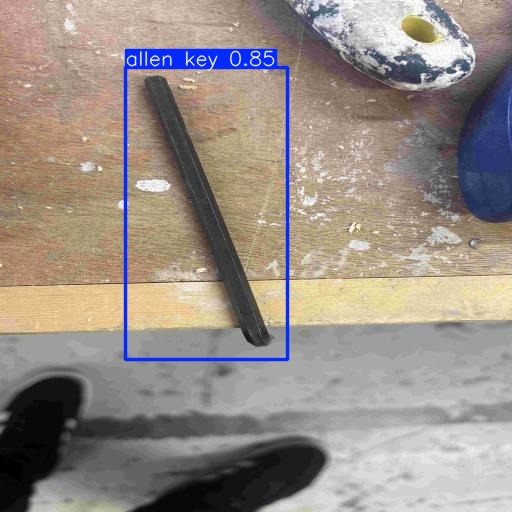

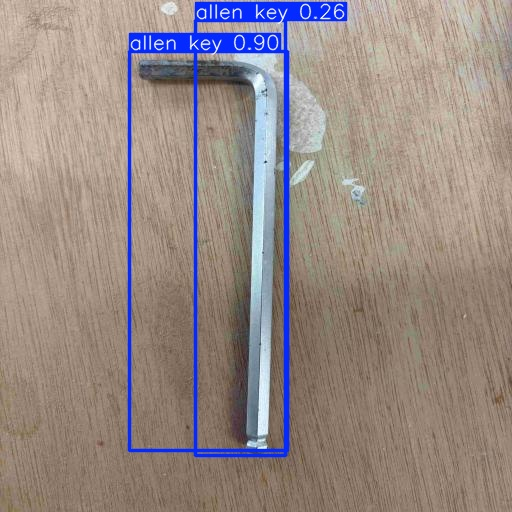

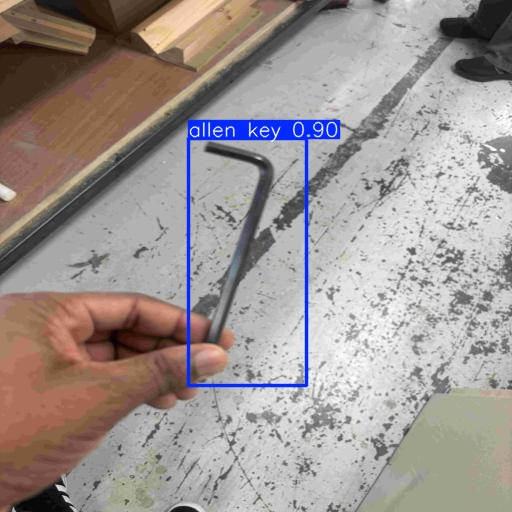

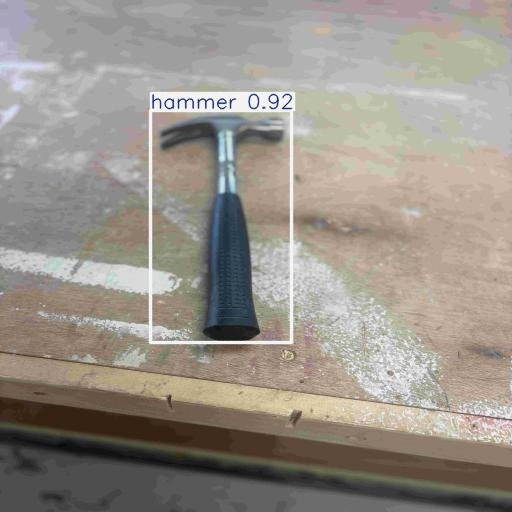

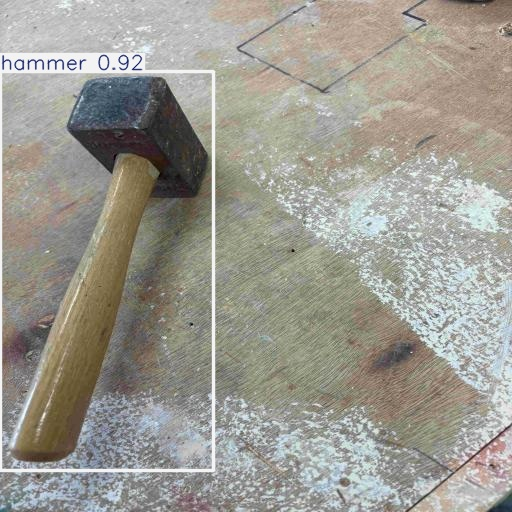

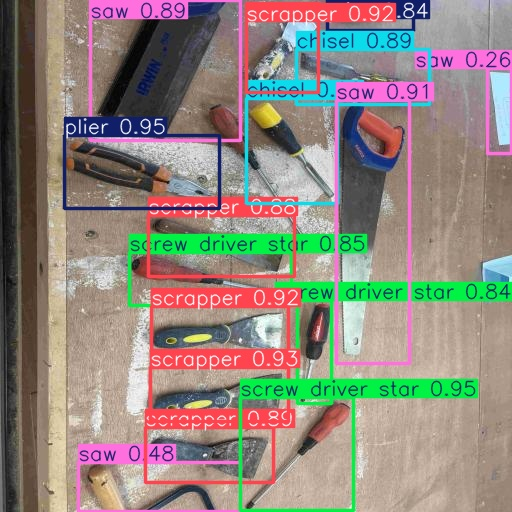

In [30]:
print_predicted_images("YOLOv8_with_aug_predictions")

## Training YOLOv9 with Augmented Dataset

In [31]:
%cd {HOME}
!yolo task=detect mode=train model=yolov9s.pt data={dataset_aug_v9.location}/data.yaml epochs=100 imgsz=512 plots=True name="YOLOv9_with_aug"

/content
New https://pypi.org/project/ultralytics/8.3.235 available 😃 Update with 'pip install -U ultralytics'
Ultralytics YOLOv8.2.103 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov9s.pt, data=/content/datasets/Hand-Tool-Detection-6/data.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=512, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=YOLOv9_with_aug, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina

/content


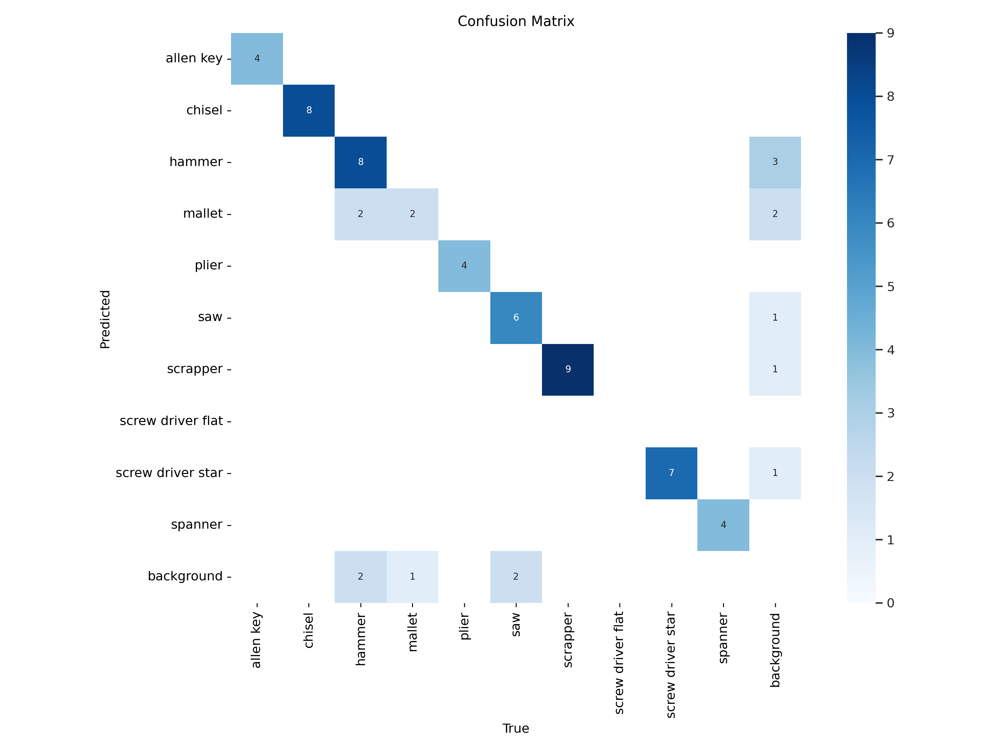

In [32]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/YOLOv9_with_aug/confusion_matrix.png', width=1000)

/content


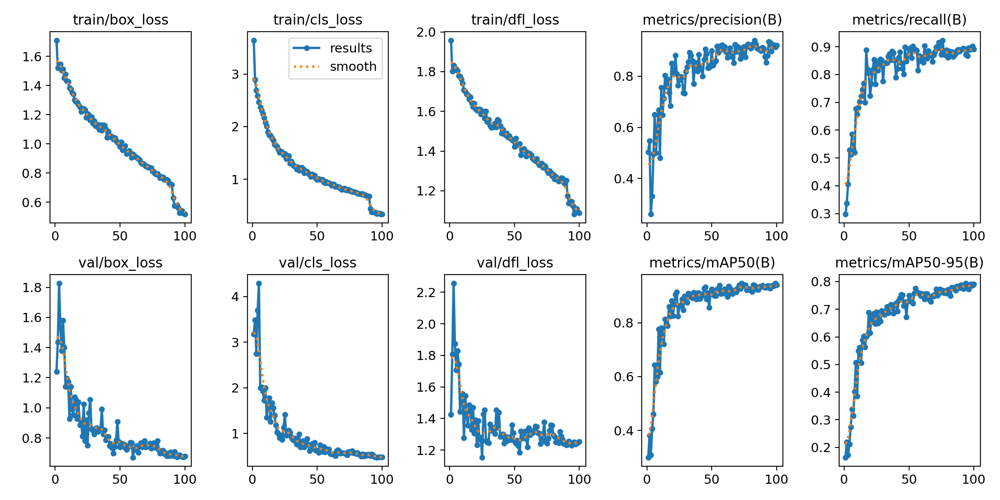

In [33]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/YOLOv9_with_aug/results.png', width=1000)

### Validate YOLOv9 with augmented data

/content


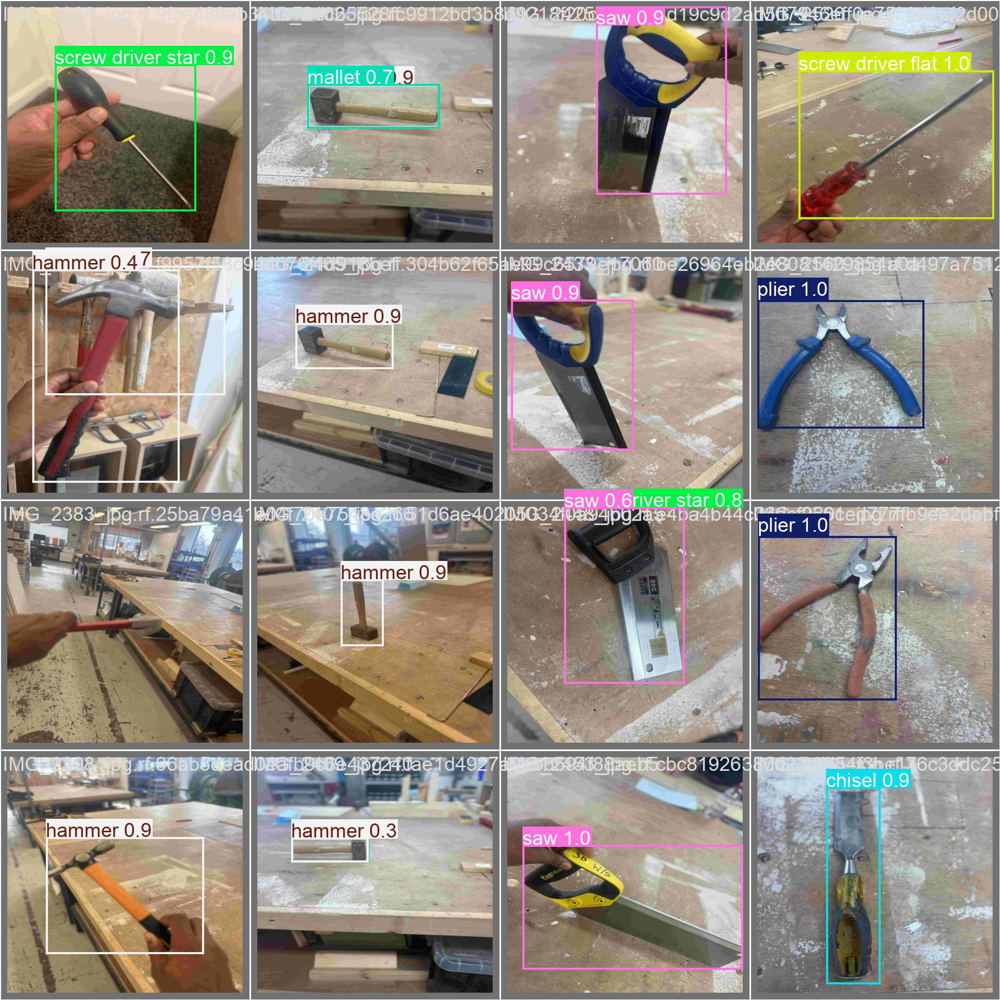

In [34]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/YOLOv9_with_aug/val_batch0_pred.jpg', width=1000)

In [35]:
%cd {HOME}
!yolo task=detect mode=val model={HOME}/runs/detect/YOLOv9_with_aug/weights/best.pt data={dataset_with_v9.location}/data.yaml

/content
Traceback (most recent call last):
  File "/usr/local/bin/yolo", line 8, in <module>
    sys.exit(entrypoint())
             ^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/ultralytics/cfg/__init__.py", line 804, in entrypoint
    model = YOLO(model, task=task)
            ^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/ultralytics/models/yolo/model.py", line 23, in __init__
    super().__init__(model=model, task=task, verbose=verbose)
  File "/usr/local/lib/python3.12/dist-packages/ultralytics/engine/model.py", line 145, in __init__
    self._load(model, task=task)
  File "/usr/local/lib/python3.12/dist-packages/ultralytics/engine/model.py", line 285, in _load
    self.model, self.ckpt = attempt_load_one_weight(weights)
                            ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/usr/local/lib/python3.12/dist-packages/ultralytics/nn/tasks.py", line 906, in attempt_load_one_weight
    ckpt, weight = torch_safe_load(weight)  # load c

### Inference with YOLOv9 augmented

In [36]:
%cd {HOME}
!yolo task=detect mode=predict model={HOME}/runs/detect/YOLOv9_with_aug/weights/best.pt conf=0.25 source={dataset_aug_v9.location}/test/images save=True name="YOLOv9_with_aug_predictions"

/content
Ultralytics YOLOv8.2.103 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
YOLOv9s summary (fused): 486 layers, 7,170,958 parameters, 0 gradients, 26.7 GFLOPs

image 1/38 /content/datasets/Hand-Tool-Detection-6/test/images/IMG_2385_jpg.rf.6ef11b5af92f9946bc3ea109902311b9.jpg: 512x512 1 plier, 15.5ms
image 2/38 /content/datasets/Hand-Tool-Detection-6/test/images/IMG_2386_jpg.rf.1439edfbf4836fd4f95d12dfd5083c83.jpg: 512x512 1 plier, 1 saw, 15.6ms
image 3/38 /content/datasets/Hand-Tool-Detection-6/test/images/IMG_2389_jpg.rf.750a11e918c9dab3e1eb802a79961d48.jpg: 512x512 1 hammer, 15.5ms
image 4/38 /content/datasets/Hand-Tool-Detection-6/test/images/IMG_2393_jpg.rf.5ec86b912a3e7fc706465f54be3f05f8.jpg: 512x512 1 hammer, 1 plier, 15.6ms
image 5/38 /content/datasets/Hand-Tool-Detection-6/test/images/IMG_2429_jpg.rf.12c7ffca297064877f35cba78eafe650.jpg: 512x512 2 saws, 24.0ms
image 6/38 /content/datasets/Hand-Tool-Detection-6/test/images/IMG_2440_jpg.rf.ab6916c459e15dd13

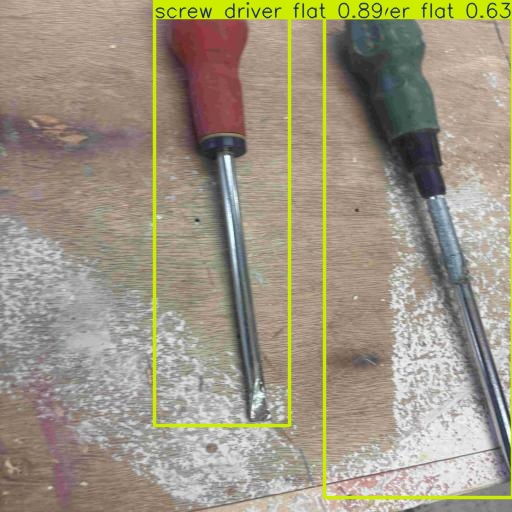

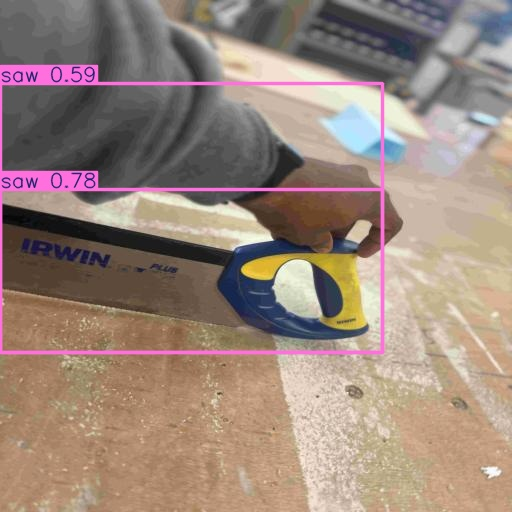

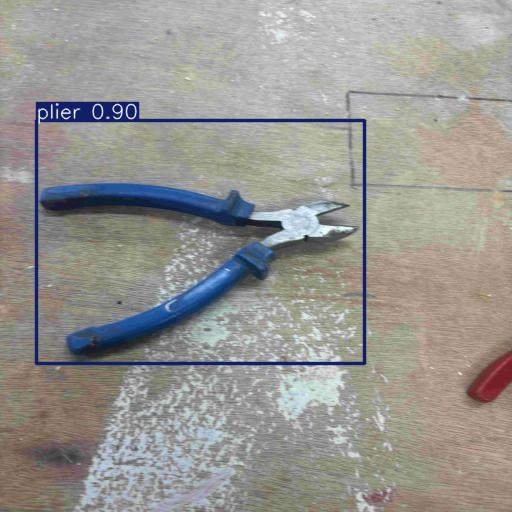

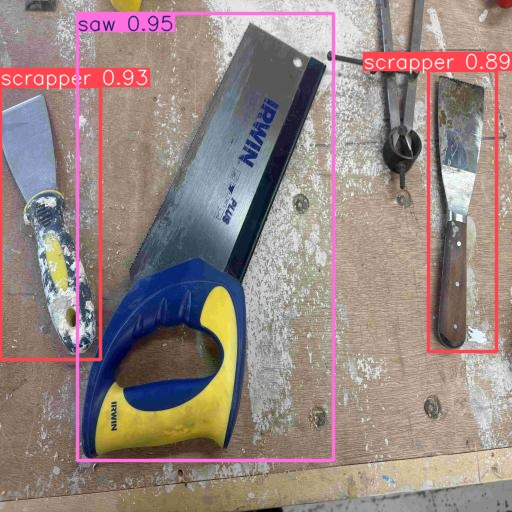

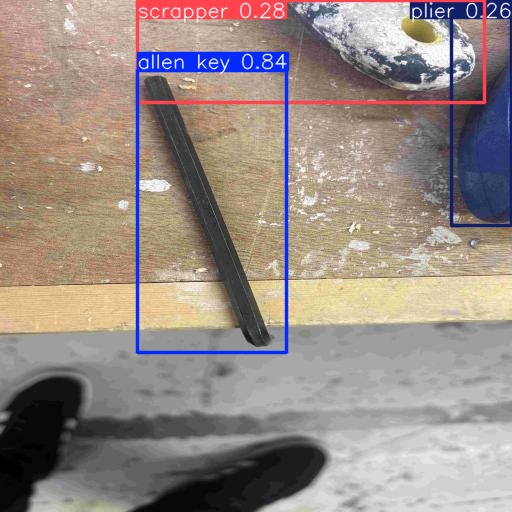

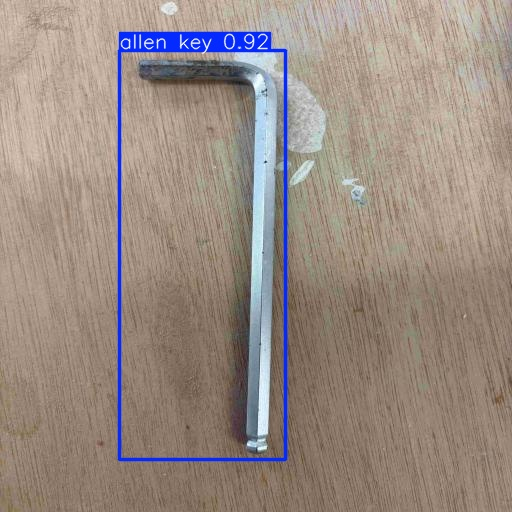

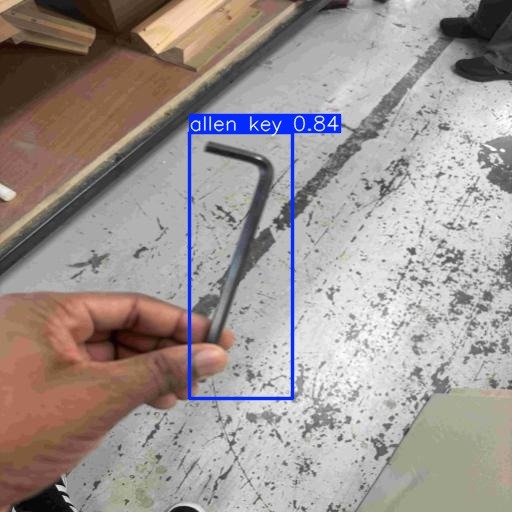

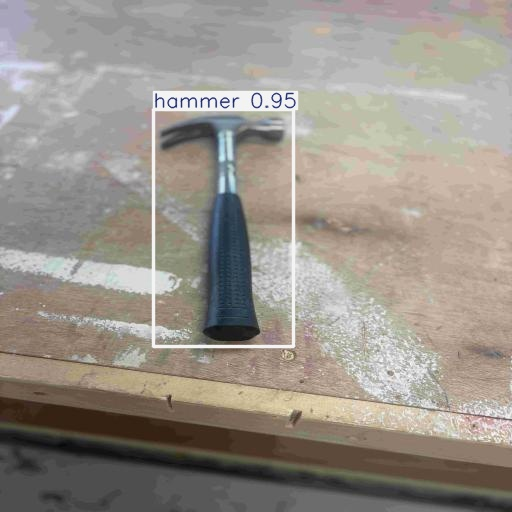

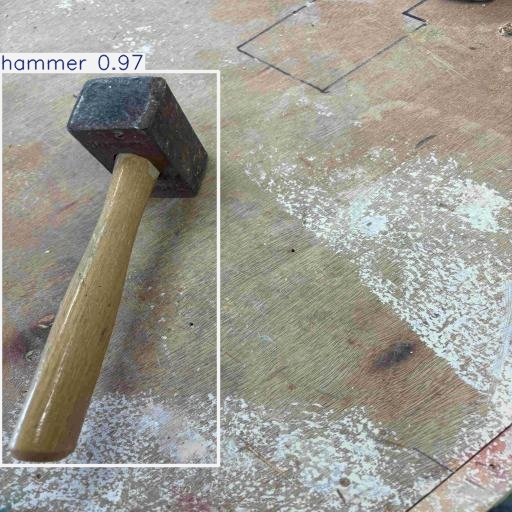

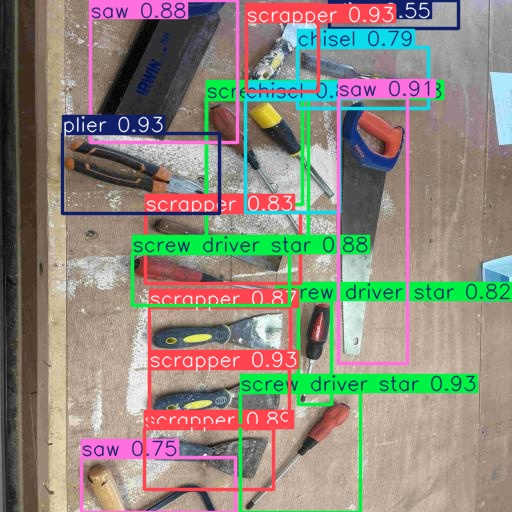

In [37]:
print_predicted_images("YOLOv9_with_aug_predictions")